**1. Setting Up the Environment**

 Install Required Libraries


In [ ]:
!pip install geopandas matplotlib folium contextily mapclassify cartopy shapely -q

**2. Load and Explore Geospatial Data**

Load a Shapefile

   FID                              globalid  uniq_id  timestamp  \
0    1  03e7c550-533e-4a1b-9d39-0cc33fa7b992    28920 2019-08-09   
1    2  fb8437ba-302a-4398-8c60-599d29d818ab    28922 2019-08-09   
2    3  6dd43980-dc31-4b23-af8d-76a5690b8b13    28925 2019-08-09   
3    4  f7345210-4fc2-43ab-b2c8-f435a8c120f4    28927 2019-08-09   
4    5  8cdb745d-8605-44cd-b28f-43318af764c7    28930 2020-08-31   

           editor        lganame lgacode    statename statecode     source  \
0  nuraddeen.isah  Eastern Obolo    3002    Akwa Ibom        AK  eHA_Polio   
1  nuraddeen.isah       Ekeremor    6002      Bayelsa        BY  eHA_Polio   
2      najib.adam         Degema   33008       Rivers        RI  eHA_Polio   
3  nuraddeen.isah         Andoni   33005       Rivers        RI  eHA_Polio   
4      najib.adam       Akpabuyo    9003  Cross River        CR       GRID   

      amapcode  Shape__Are  Shape__Len  \
0  NIE AKS KRT    0.012883    0.664376   
1  NIE BYS KMR    0.149653    2.176681

<Axes: >

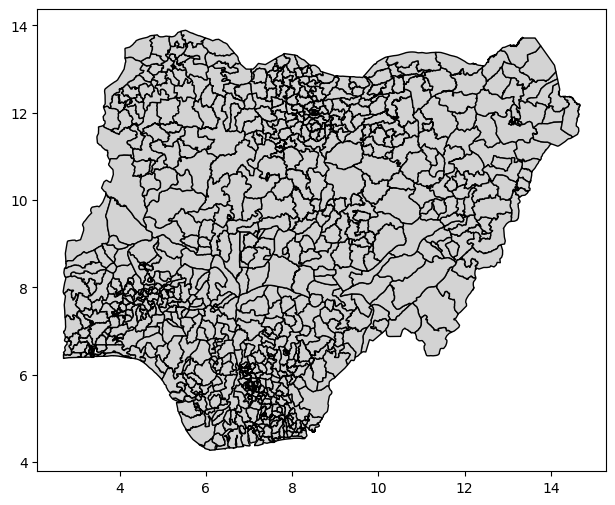

In [ ]:
import geopandas as gpd

# Load shapefile
gdf = gpd.read_file("/content/GRID3_NGA_-_Operational_LGA_Boundaries.shp")

#Check the first few rows
print(gdf.head())

# Plot the basic map
gdf.plot(figsize=(10, 6), edgecolor="black", color="lightgrey")

In [ ]:
import pandas as pd
import geopandas as gpd

# Load and clean population Excel
pop_df = pd.read_excel("/content/GeoPoDe_NGA_Population_20250826142658.xlsx", skiprows=5)
pop_df = pop_df[["State", "LGA", "Total"]]
pop_df.columns = ["statename", "lganame", "Population"]
pop_df = pop_df.dropna(subset=["Population"])
print(pop_df.head())

  statename    lganame    Population
0      Abia        NaN  3.399523e+06
1      Abia  Aba North  2.786136e+05
2      Abia  Aba North  2.000000e+00
3      Abia  Aba South  2.844015e+05
4      Abia  Arochukwu  1.314027e+05


In [ ]:
import pandas as pd
import geopandas as gpd

# LOAD SHAPEFILE
gdf = gpd.read_file("/content/GRID3_NGA_-_Operational_LGA_Boundaries.shp")

gdf["statename"] = gdf["statename"].str.strip().str.title()
gdf["lganame"] = gdf["lganame"].str.strip().str.title()

# LOAD POPULATION DATA
pop_df = pd.read_excel(
    "/content/GeoPoDe_NGA_Population_20250826142658.xlsx",
    skiprows=5
)

pop_df = pop_df[["State", "LGA", "Total"]]
pop_df.columns = ["statename", "lganame", "Population"]

# Remove state total rows (NaN LGAs)
pop_df = pop_df.dropna(subset=["lganame"])

# Normalize Excel names
pop_df["statename"] = pop_df["statename"].str.strip().str.title()
pop_df["lganame"] = (
    pop_df["lganame"]
    .str.replace("-", " ", regex=False)
    .str.replace("  ", " ")
    .str.strip()
    .str.title()
)

# REMOVE MICRODATA ROWS
# Keep only the largest value per LGA
pop_df = pop_df.sort_values("Population", ascending=False)
pop_df = pop_df.groupby(["statename", "lganame"], as_index=False).first()

# FIX KNOWN LGA NAME DIFFERENCES

fix_names = {
    "Ardo Kola": "Ardo-Kola",
    "Warri South West": "Warri South-West",
}

pop_df["lganame"] = pop_df["lganame"].replace(fix_names)

# MERGE
merged_gdf = gdf.merge(pop_df, on=["statename", "lganame"], how="left")

print(merged_gdf[["statename", "lganame", "Population"]].head(50))

# SAVE CLEAN SHAPEFILE
merged_gdf.to_file("Nigeria_LGA_with_Population_clean.shp")
print("Clean shapefile saved as 'Nigeria_LGA_with_Population_clean.shp'")


      statename            lganame     Population
0     Akwa Ibom      Eastern Obolo   22686.491657
1       Bayelsa           Ekeremor   96107.925606
2        Rivers             Degema   24103.647447
3        Rivers             Andoni   55664.065300
4   Cross River           Akpabuyo   71875.397355
5     Akwa Ibom               Oron   75061.962058
6   Cross River            Bakassi   19049.463071
7   Cross River      Calabar South  193547.980826
8     Akwa Ibom          Udung Uko   13669.862179
9       Bayelsa      Southern Ijaw  133915.424544
10          Oyo            Iwajowa  111181.641327
11          Oyo      Ibarapa North   84733.046304
12       Rivers             Okrika  141637.056197
13         Ogun         Imeko Afon  137387.394853
14    Akwa Ibom              Ibeno   50626.279549
15      Bayelsa              Nembe   41422.289158
16         Ondo              Ilaje  175722.321548
17      Bayelsa              Brass   61403.914167
18        Delta        Warri North   59168.415000


/usr/local/lib/python3.12/dist-packages/pyogrio/raw.py:723: RuntimeWarning: Field timestamp create as date field, though DateTime requested.
  ogr_write(


   FID                              globalid  uniq_id  timestamp  \
0    1  03e7c550-533e-4a1b-9d39-0cc33fa7b992    28920 2019-08-09   
1    2  fb8437ba-302a-4398-8c60-599d29d818ab    28922 2019-08-09   
2    3  6dd43980-dc31-4b23-af8d-76a5690b8b13    28925 2019-08-09   
3    4  f7345210-4fc2-43ab-b2c8-f435a8c120f4    28927 2019-08-09   
4    5  8cdb745d-8605-44cd-b28f-43318af764c7    28930 2020-08-31   

           editor        lganame lgacode    statename statecode     source  \
0  nuraddeen.isah  Eastern Obolo    3002    Akwa Ibom        AK  eHA_Polio   
1  nuraddeen.isah       Ekeremor    6002      Bayelsa        BY  eHA_Polio   
2      najib.adam         Degema   33008       Rivers        RI  eHA_Polio   
3  nuraddeen.isah         Andoni   33005       Rivers        RI  eHA_Polio   
4      najib.adam       Akpabuyo    9003  Cross River        CR       GRID   

      amapcode  Shape__Are  Shape__Len    Population  \
0  NIE AKS KRT    0.012883    0.664376  22686.491657   
1  NIE BYS

<Axes: >

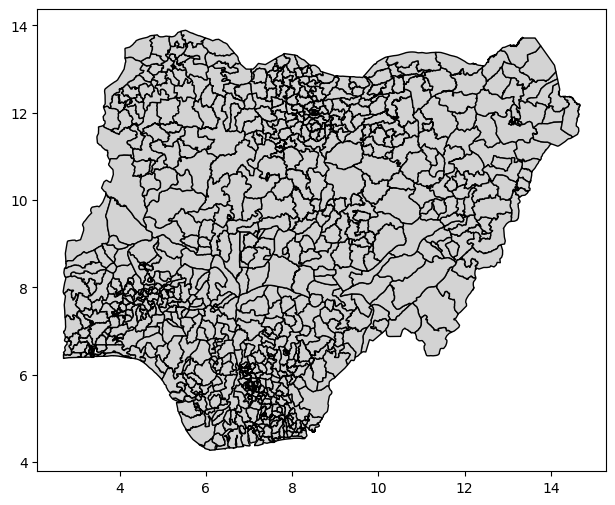

In [ ]:
import geopandas as gpd

# Load shapefile
gdf = gpd.read_file("/content/Nigeria_LGA_with_Population_clean.shp")

#Check the first few rows
print(gdf.head())

# Plot the basic map
gdf.plot(figsize=(10, 6), edgecolor="black", color="lightgrey")

Enhancing Visualization with Color Classification

Apply Choropleth Mapping

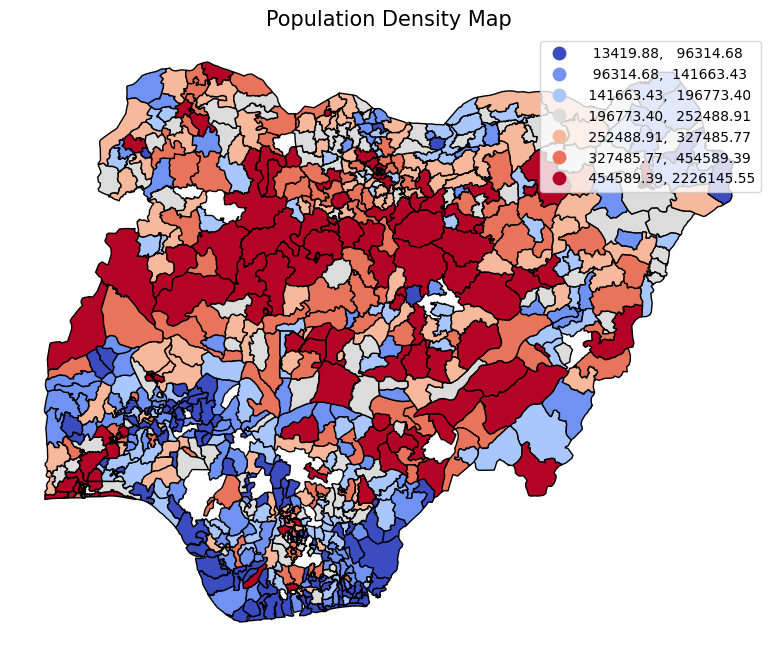

In [ ]:
import geopandas as gpd
import matplotlib.pyplot as plt
import mapclassify
import numpy as np

# Load shapefile
gdf = gpd.read_file("/content/Nigeria_LGA_with_Population_clean.shp")


# Define a figure
fig, ax = plt.subplots(figsize=(12, 8))

# Plot the map with classification
gdf.plot(column="Population", cmap="coolwarm",
         legend=True, scheme="Quantiles", k=7, edgecolor="black", ax=ax)

# Title and Layout
ax.set_title("Population Density Map", fontsize=15)
ax.set_axis_off()

plt.show()


Adding Basemap and Contextual Information

We can overlay OpenStreetMap tiles using Contextily to enhance readability.

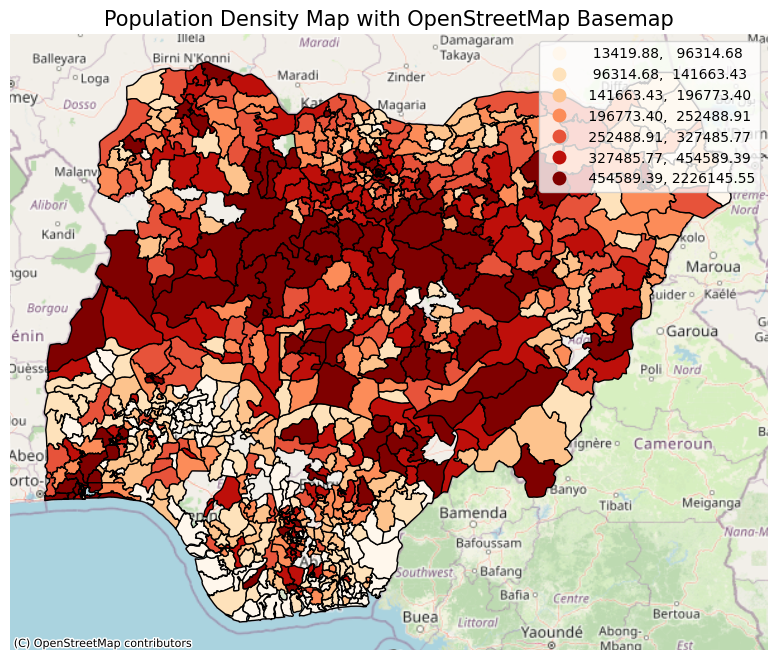

In [ ]:
import contextily as ctx

# Convert to Web Mercator Projection (Required for basemaps)
gdf = gdf.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(12, 8))

# Plot the map
gdf.plot(column="Population", cmap="OrRd",
         legend=True, scheme="Quantiles", k=7, edgecolor="black", ax=ax)

# Add basemap
ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)

# Title and Layout
ax.set_title("Population Density Map with OpenStreetMap Basemap", fontsize=15)
ax.set_axis_off()

plt.show()


Interactive Map with Folium

Let's create an interactive web map using Folium, allowing zooming and clicking features.




In [ ]:
# Convert CRS to WGS84 (EPSG:4326) if needed
gdf = gdf.to_crs(epsg=4326)

import pandas as pd # Import pandas to check data types


# Identify columns with Timestamp dtype and convert them to string
for col in gdf.columns:
    if pd.api.types.is_datetime64_any_dtype(gdf[col]):
        gdf[col] = gdf[col].astype(str)

In [ ]:
import folium

# Get map center
centroid = gdf.geometry.centroid.iloc[0]
map_center = [centroid.y, centroid.x]

# Create Folium map
m = folium.Map(location=map_center, zoom_start=10)

# Make polygon clickable using tooltip + popup
folium.GeoJson(
    gdf,
    name="Population Density",
    style_function=lambda x: {
        "fillColor": "green",
        "color": "black",
        "weight": 1,
        "fillOpacity": 0.6,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=[col for col in gdf.columns if col != "geometry"],
        aliases=[col + ":" for col in gdf.columns if col != "geometry"],
        localize=True
    ),
    popup=folium.GeoJsonPopup(
        fields=[col for col in gdf.columns if col != "geometry"],
        aliases=[col + ":" for col in gdf.columns if col != "geometry"],
        localize=True
    )
).add_to(m)

# Layer control
folium.LayerControl().add_to(m)

m


/tmp/ipython-input-1985612143.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid = gdf.geometry.centroid.iloc[0]


In [ ]:
m.save("my_interactive_map.html")

In [ ]:
import folium

# Filter for Ibadan LGAs (Oyo State)
ibadan_gdf = gdf[(gdf["statename"] == "Oyo") & (gdf["lganame"].str.contains("Ibadan"))]

# Check that we have the correct LGAs
print(ibadan_gdf[["statename", "lganame", "Population"]])

# Get centroid for map center
centroid = ibadan_gdf.geometry.centroid.unary_union.centroid
map_center = [centroid.y, centroid.x]



    statename            lganame     Population
316       Oyo  Ibadan North East  232066.857082
754       Oyo       Ibadan North  226845.027668
757       Oyo  Ibadan North West  140270.596573
758       Oyo  Ibadan South West  130396.239535
759       Oyo  Ibadan South East  179464.325999


/tmp/ipython-input-2650670623.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centroid = ibadan_gdf.geometry.centroid.unary_union.centroid
/tmp/ipython-input-2650670623.py:10: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  centroid = ibadan_gdf.geometry.centroid.unary_union.centroid


In [ ]:
# Create Folium map
ibadan_map = folium.Map(location=map_center, zoom_start=11, tiles="cartodbpositron")

# Add polygons with tooltips and popups
folium.GeoJson(
    ibadan_gdf,
    name="Ibadan Population Density",
    style_function=lambda x: {
        "fillColor": "orange",
        "color": "black",
        "weight": 1.5,
        "fillOpacity": 0.6,
    },
    tooltip=folium.GeoJsonTooltip(
        fields=["statename", "lganame", "Population"],
        aliases=["State:", "LGA:", "Population:"],
        localize=True
    ),
    popup=folium.GeoJsonPopup(
        fields=["statename", "lganame", "Population"],
        aliases=["State:", "LGA:", "Population:"],
        localize=True
    )
).add_to(ibadan_map)

# Add layer control
folium.LayerControl().add_to(ibadan_map)

# Display map
ibadan_map

In [ ]:
# Save to HTML
ibadan_map.save("Ibadan_Population_Map.html")
print("Interactive map for Ibadan saved as 'Ibadan_Population_Map.html'")


Interactive map for Ibadan saved as 'Ibadan_Population_Map.html'


In [ ]:
from google.colab import files

files.download("Ibadan_Population_Map.html")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

### **Insight on Nigeria State-Level Population Density and Administrative Boundaries Map**

A geospatial analysis was conducted to visualize population distribution across Nigeria at the LGA level, with the purpose of providing insights into population density patterns for planning, resource allocation, and local development initiatives. The Nigeria LGA shapefile and population dataset were loaded, and state and LGA names were cleaned and normalized to resolve inconsistencies. Duplicate and microdata rows were removed, and the population data was merged with the shapefile to create a comprehensive GeoDataFrame containing population figures for each LGA. Static maps were generated using Matplotlib, displaying population distribution through a choropleth map classified by quantiles. To enhance spatial understanding, the data was overlaid on an OpenStreetMap basemap via `contextily`. An interactive Folium map was then created using the WGS84 CRS, with clickable polygons, tooltips, and popups showing LGA names and population values, and layer controls for better user interaction. A subset of LGAs corresponding to Ibadan was extracted, and a separate interactive map centered on the city was produced to allow detailed examination of local population patterns.

**Key points of the workflow include:**

* Cleaning and merging population and shapefile data
* Generating static and choropleth maps to visualize population distribution
* Adding basemaps for spatial context
* Creating interactive Folium maps with tooltips, popups, and layer controls
* Focusing on a localized area (Ibadan) for detailed insights

This work is important because understanding population density at local levels supports informed decision-making for urban planning, healthcare accessibility, infrastructure development, and emergency response. Interactive maps provide accessible and interpretable visualizations for both national and local population patterns.
